<a href="https://colab.research.google.com/github/oussamarhouch/Projet-Audio/blob/main/test_(4).ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Projet simulation logicielle
* *Rhouch Oussama*
* *Cherki Inssaf*

<img src="https://github.com/oussamarhouch/Projet-Audio/blob/main/figure/model%20based.png?raw=1" alt="CS" style="width: 750px;"/>

### Import libraries

```python

In [1]:
import librosa
import librosa.display
import numpy as np
from scipy.io.wavfile import write
from sklearn import preprocessing
from sklearn.preprocessing import scale
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
import zipfile
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torchsummary import summary
from torch.utils.data import DataLoader, Dataset
from torch.nn.utils.rnn import pad_sequence
import warnings
import logging
torch.cuda.empty_cache()
warnings.filterwarnings('ignore')
logging.basicConfig(level=logging.INFO)
import os
os.environ["CUDA_VISIBLE_DEVICES"] = "0"
from IPython.display import Audio
import plotly.graph_objs as go

### load data

```python

##### zip files

In [2]:
# own IDE
#zip_file_paths = ['data/data_part1.zip', 'data/data_part2.zip', 'data/data_part3.zip', 'data/data_part4.zip']

# Google Colab
from google.colab import drive
drive.mount('/content/drive')

os.makedirs("data", exist_ok=True)

zip_file_paths = ['/content/drive/My Drive/audio_project/data_part1.zip',
'/content/drive/My Drive/audio_project/data_part2.zip',
'/content/drive/My Drive/audio_project/data_part3.zip',
'/content/drive/My Drive/audio_project/data_part4.zip']

Mounted at /content/drive


##### unzip files

In [3]:
for zip_file_path in zip_file_paths:
    with zipfile.ZipFile(zip_file_path, 'r') as zip_ref:
        zip_ref.extractall(".")

##### data folders

In [4]:
noise_folder = "data/noise/"
clean_folder = "data/clean/dev-clean"
output_folder = "data/noisy/"
denoising_folder = "data/denoising/"

# Create the output folder if it doesn't exist
os.makedirs(output_folder, exist_ok=True)
os.makedirs(denoising_folder, exist_ok=True)

##### audio duration

In [5]:
target_duration = 4 # 4sec

##### clean path

In [6]:
clean_path = []
for folder in os.listdir(clean_folder):
    folder_path = os.path.join(clean_folder, folder)
    if os.path.isdir(folder_path):
        for root, dirs, files in os.walk(folder_path):
            for file in files:
                if file.endswith(".flac"):
                    file_path = os.path.join(root, file)
                    clean_path.append(file_path)

##### clean data

In [7]:
clean_data = []
for clean_file in clean_path:
    s, sr = librosa.load(clean_file, sr=16000)
    target_length = target_duration * sr
    num_chunks = len(s) // target_length

    for i in range(num_chunks):
        start = i * target_length
        end = start + target_length
        chunk = s[start:end]
        clean_data.append(chunk)

len(clean_data)

3349

##### noise data

In [8]:
noise_file = ""
if os.path.isdir(noise_folder):
        for root, dirs, files in os.walk(noise_folder):
            for file in files:
                if file.endswith(".wav"):
                    noise_file = os.path.join(root, file)

### Data exploration

```python

#### Clean audio

##### write clean audio

In [9]:
s_rate = 16000
s = chunk
write("clean.wav", s_rate, s)

##### Read clean Audio

In [10]:
Audio("clean.wav")

##### normalize clean audio

In [11]:
s_norm = preprocessing.normalize(s.reshape(1, -1), norm='max')

##### scale clean audio

In [12]:
s_scale = scale(s_norm, axis=1, with_mean=True, with_std=True, copy=True)

##### Fourier transform of clean audio

In [13]:
s_fft = librosa.stft(s_scale[0], n_fft=512, hop_length=256, win_length=512, window='hann', center=True, pad_mode='reflect')

##### Convert to spectrogram

In [14]:
s_db = librosa.amplitude_to_db(np.abs(s_fft), ref=np.max)

#### Noise audio

##### read noise audio

In [15]:
u, ur = librosa.load(noise_file, sr=16000)

##### adjust noise audio length

In [16]:
target_length = target_duration * ur
u = librosa.util.fix_length(u, size = target_length)

##### Write noise audio

In [17]:
write("noise.wav", ur, u)

##### Read noise audio

In [18]:
Audio("noise.wav")

##### Normalize noise audio

In [19]:
u_norm = preprocessing.normalize(u.reshape(1, -1), norm='max')

##### Scale noise audio

In [20]:
u_scale = scale(u_norm, axis=1, with_mean=True, with_std=True, copy=True)

##### Fourier transform of noise audio

In [21]:
u_fft = librosa.stft(u_scale[0], n_fft=512, hop_length=256, win_length=512, window='hann', center=True, pad_mode='reflect')

##### Convert to spectrogram

In [22]:
u_db = librosa.amplitude_to_db(np.abs(u_fft))

#### Noisy audio

##### ratio signal to noise

In [23]:
rsb = 6
alpha = 10**(-rsb/10)

##### Create noisy audio

In [24]:
len(s)

64000

In [25]:
x = s + alpha * u[:len(s)]

##### Write noisy audio

In [26]:
write(os.path.join('', "mixed.wav"), s_rate, x)

##### Read noisy audio

In [27]:
Audio(os.path.join('', "mixed.wav"))

##### Normalize noisy audio

In [28]:
x_norm = preprocessing.normalize(x.reshape(1, -1), norm='max')

##### Scale noisy audio

In [29]:
x_scale = scale(x_norm, axis=1, with_mean=True, with_std=True, copy=True)

##### Fourier transform of noisy audio

In [30]:
x_fft = librosa.stft(x_scale[0], n_fft=512, hop_length=256, win_length=512, window='hann', center=True, pad_mode='reflect')

##### Convert to spectrogram

In [31]:
x_db = librosa.amplitude_to_db(np.abs(x_fft))

### Data Manipulation
    
```python   

##### l2 norm

In [32]:
s_l2 = np.linalg.norm(s_fft, ord=1, axis=0, keepdims=True)
u_l2= np.linalg.norm(u_fft, ord=1, axis=0, keepdims=True)
x_l2 = np.linalg.norm(x_fft, ord=2, axis=0, keepdims=True)

##### Normalize fourier transforma

In [33]:
s_norm = s_fft / s_l2 + 1e-8
u_norm = u_fft / u_l2 + 1e-8
x_norm = x_fft / x_l2 + 1e-8

##### Mask computation

In [34]:
mask = np.where(np.abs(s_norm ** 2) > np.abs(u_norm ** 2), 1, 0)

##### logarithmic scale

In [35]:
log_noisy = np.log1p(np.abs(x_norm))

##### Apply mask

In [36]:
x_mag = torch.abs(torch.tensor(x_fft))
x_phase = torch.angle(torch.tensor(x_fft))

complex_x = torch.complex(x_mag * torch.cos(x_phase), x_mag * torch.sin(x_phase))

masked_x_fft = torch.tensor(mask) * complex_x

##### Inverse fourier transform

In [37]:
masked_x = librosa.istft(masked_x_fft.numpy(), hop_length=256, win_length=512, window='hann', center=True, length=len(s))
masked_x = masked_x / np.max(np.abs(masked_x))

##### Write cleaned audio

In [38]:
write(os.path.join(denoising_folder, "denoised_" + str(8) + ".wav"), s_rate, masked_x.astype(np.float32))

##### Read cleaned audio

In [39]:
Audio(os.path.join(denoising_folder, "denoised_" + str(8) + ".wav"))

##### Plot of curves

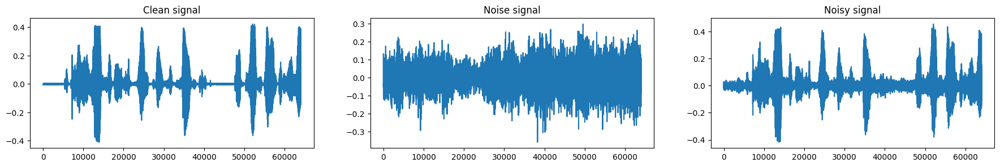

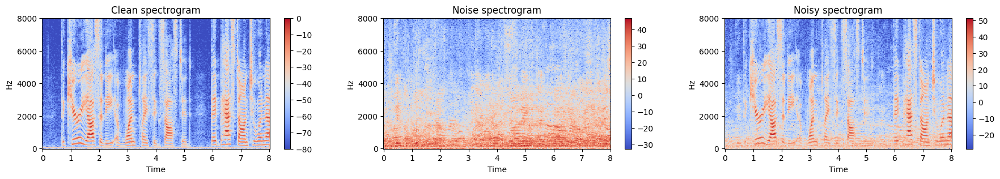

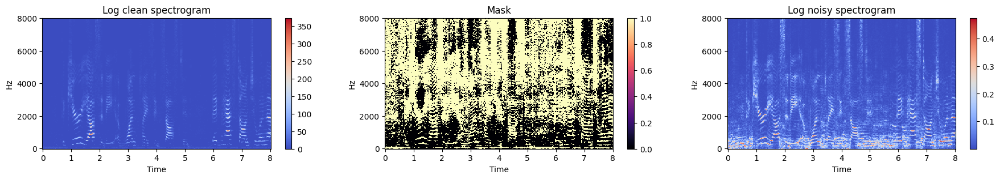

In [40]:
plt.figure(figsize=(22, 3))
plt.subplot(1, 3, 1)
plt.plot(s)
plt.title("Clean signal")
plt.subplot(1, 3, 2)
plt.plot(u)
plt.title("Noise signal")
plt.subplot(1, 3, 3)
plt.plot(x)
plt.title("Noisy signal")
plt.show()

plt.figure(figsize=(22, 3))
plt.subplot(1, 3, 1)
librosa.display.specshow(s_db, sr=s_rate, x_axis='time', y_axis='hz', cmap='coolwarm')
plt.colorbar()
plt.title("Clean spectrogram")
plt.subplot(1, 3, 2)
librosa.display.specshow(u_db, sr=s_rate, x_axis='time', y_axis='hz', cmap='coolwarm')
plt.colorbar()
plt.title("Noise spectrogram")
plt.subplot(1, 3, 3)
librosa.display.specshow(x_db, sr=s_rate, x_axis='time', y_axis='hz', cmap='coolwarm')
plt.colorbar()
plt.title("Noisy spectrogram")
plt.show()

plt.figure(figsize=(22, 3))
plt.subplot(1, 3, 1)
librosa.display.specshow(masked_x_fft.numpy(), sr=s_rate, x_axis='time', y_axis='hz', cmap='coolwarm')
plt.colorbar()
plt.title("Log clean spectrogram")
plt.subplot(1, 3, 2)
librosa.display.specshow(mask, sr=s_rate, x_axis='time', y_axis='hz')
plt.colorbar()
plt.title("Mask")

# Second subplot
plt.subplot(1, 3, 3)
librosa.display.specshow(log_noisy, sr=s_rate, x_axis='time', y_axis='hz', cmap='coolwarm')
plt.colorbar()
plt.title("Log noisy spectrogram")

plt.show()


### Preprocessing

```python

##### Dataset class

In [41]:
class AudioDataset(Dataset):
    def __init__(self, clean_data, noise_file, rsb):
        self.clean_data = clean_data
        self.noise_file = noise_file
        self.masks = []
        self.log_noisy_spec = []
        self.rsb = rsb

    def __len__(self):
        return len(self.clean_data)

    def process(self):
        for idx in range(len(self.clean_data)):
            s = self.clean_data[idx]
            u, ur = librosa.load(self.noise_file, sr=16000)
            target_length = len(s)
            u = librosa.util.fix_length(u, size = target_length)
            alpha = 10**(-self.rsb/10)
            x = s + alpha * u[:len(s)]

            # save noisy file
            write(os.path.join(output_folder, "noisy_" + str(idx) + ".wav"), s_rate, x)

            # fourier transform
            s_fft = librosa.stft(s, n_fft=512, hop_length=256, win_length=512, window='hann', center=True, pad_mode='reflect')
            u_fft = librosa.stft(u, n_fft=512, hop_length=256, win_length=512, window='hann', center=True, pad_mode='reflect')
            x_fft = librosa.stft(x, n_fft=512, hop_length=256, win_length=512, window='hann', center=True, pad_mode='reflect')

            # normalize the data
            s_l2 = np.linalg.norm(s_fft, ord=2, axis=0, keepdims=True)
            u_l2 = np.linalg.norm(u_fft, ord=2, axis=0, keepdims=True)
            x_l2 = np.linalg.norm(x_fft, ord=2, axis=0, keepdims=True)

            s_norm = s_fft / s_l2 + 1e-8
            u_norm = u_fft / u_l2 + 1e-8
            x_norm = x_fft / x_l2 + 1e-8

            # change to torch
            x_norm = torch.from_numpy(x_norm)

            mask = np.where(np.abs(s_norm) > np.abs(u_norm), 1, 0)
            mask = torch.from_numpy(mask)

            log_noisy = torch.log1p(torch.abs(x_norm))

            self.masks.append(mask)
            self.log_noisy_spec.append(log_noisy)

    def __getitem__(self, idx):
        return self.masks[idx], self.log_noisy_spec[idx]

##### Dataset Creation

In [42]:
dataset = AudioDataset(clean_data, noise_file, rsb=6)
dataset.process()

### Deep Learning Model

```python

##### Network architecture

In [43]:
import torch
import torch.nn as nn
import torch.nn.functional as F

class CNN(nn.Module):
    def __init__(self):
        super(CNN, self).__init__()

        # Increase the number of filters in convolutional layers
        self.conv1 = nn.Conv2d(1, 64, kernel_size=(3, 3), stride=1, padding=1)
        self.bn1 = nn.BatchNorm2d(64)
        self.pool1 = nn.MaxPool2d(kernel_size=(2, 2), stride=2, padding=0)

        self.conv2 = nn.Conv2d(64, 128, kernel_size=(3, 3), stride=1, padding=1)
        self.bn2 = nn.BatchNorm2d(128)
        self.pool2 = nn.MaxPool2d(kernel_size=(2, 2), stride=2, padding=0)

        # Adding an additional convolutional layer
        self.conv3 = nn.Conv2d(128, 256, kernel_size=(3, 3), stride=1, padding=1)
        self.bn3 = nn.BatchNorm2d(256)
        self.pool3 = nn.MaxPool2d(kernel_size=(2, 2), stride=2, padding=0)

        # Increase the number of filters in deconvolutional layers
        self.deconv1 = nn.ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=2, padding=1)
        self.bn4 = nn.BatchNorm2d(128)
        self.deconv2 = nn.ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=2, padding=1)
        self.bn5 = nn.BatchNorm2d(64)
        self.deconv3 = nn.ConvTranspose2d(64, 1, kernel_size=(4, 4), stride=2, padding=1)

        # Additional padding layers
        self.pad = nn.ZeroPad2d((1, 2, 0, 1))  # Left, Right, Top, Bottom

    def forward(self, x):
        x = F.relu(self.bn1(self.conv1(x)))
        x = self.pool1(x)
        x = F.relu(self.bn2(self.conv2(x)))
        x = self.pool2(x)
        x = F.relu(self.bn3(self.conv3(x)))
        x = self.pool3(x)
        x = F.relu(self.bn4(self.deconv1(x)))
        x = F.relu(self.bn5(self.deconv2(x)))
        x = self.deconv3(x)
        x = self.pad(x)  # Apply padding
        x = torch.sigmoid(x)
        return x

##### Model definition

In [44]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [45]:
model = CNN().to(device)

##### Model Optimizer

In [46]:
criteria = nn.MSELoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)

##### Model Summary

In [47]:
summary(model, input_size=(1, 257, 126))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 64, 257, 126]             640
       BatchNorm2d-2         [-1, 64, 257, 126]             128
         MaxPool2d-3          [-1, 64, 128, 63]               0
            Conv2d-4         [-1, 128, 128, 63]          73,856
       BatchNorm2d-5         [-1, 128, 128, 63]             256
         MaxPool2d-6          [-1, 128, 64, 31]               0
            Conv2d-7          [-1, 256, 64, 31]         295,168
       BatchNorm2d-8          [-1, 256, 64, 31]             512
         MaxPool2d-9          [-1, 256, 32, 15]               0
  ConvTranspose2d-10          [-1, 128, 64, 30]         524,416
      BatchNorm2d-11          [-1, 128, 64, 30]             256
  ConvTranspose2d-12          [-1, 64, 128, 60]         131,136
      BatchNorm2d-13          [-1, 64, 128, 60]             128
  ConvTranspose2d-14          [-1, 1, 2

##### Train loader

In [50]:
from torch.utils.data import DataLoader, random_split

total_size = len(dataset)
test_size = int(0.3 * total_size)
train_size = total_size - test_size

train_dataset, test_dataset = random_split(dataset, [train_size, test_size])

train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=32, shuffle=False)

##### Model training

In [51]:
num_epochs = 10
train_loss = []

for epoch in range(num_epochs):
    for i, (masks, log_noisy_spec) in enumerate(train_loader):
        masks = masks.float()
        log_noisy_spec = log_noisy_spec.float()
        masks = masks.cuda()
        log_noisy_spec = log_noisy_spec.cuda()
        optimizer.zero_grad()
        outputs = model(log_noisy_spec.unsqueeze(1))
        loss = criteria(outputs, masks.unsqueeze(1))
        loss.backward()
        optimizer.step()
        train_loss.append(loss)
        if (i+1) % 10 == 0:
            print('Epoch [{}/{}], Step [{}/{}], Loss: {:.4f}'.format(epoch+1, num_epochs, i+1, len(train_loader), loss.item()))

Epoch [1/10], Step [10/74], Loss: 0.1897
Epoch [1/10], Step [20/74], Loss: 0.1903
Epoch [1/10], Step [30/74], Loss: 0.1952
Epoch [1/10], Step [40/74], Loss: 0.1867
Epoch [1/10], Step [50/74], Loss: 0.1892
Epoch [1/10], Step [60/74], Loss: 0.1850
Epoch [1/10], Step [70/74], Loss: 0.1826
Epoch [2/10], Step [10/74], Loss: 0.1805
Epoch [2/10], Step [20/74], Loss: 0.1804
Epoch [2/10], Step [30/74], Loss: 0.1863
Epoch [2/10], Step [40/74], Loss: 0.1783
Epoch [2/10], Step [50/74], Loss: 0.1816
Epoch [2/10], Step [60/74], Loss: 0.1775
Epoch [2/10], Step [70/74], Loss: 0.1834
Epoch [3/10], Step [10/74], Loss: 0.1785
Epoch [3/10], Step [20/74], Loss: 0.1781
Epoch [3/10], Step [30/74], Loss: 0.1716
Epoch [3/10], Step [40/74], Loss: 0.1699
Epoch [3/10], Step [50/74], Loss: 0.1752
Epoch [3/10], Step [60/74], Loss: 0.1721
Epoch [3/10], Step [70/74], Loss: 0.1709
Epoch [4/10], Step [10/74], Loss: 0.1700
Epoch [4/10], Step [20/74], Loss: 0.1694
Epoch [4/10], Step [30/74], Loss: 0.1688
Epoch [4/10], St

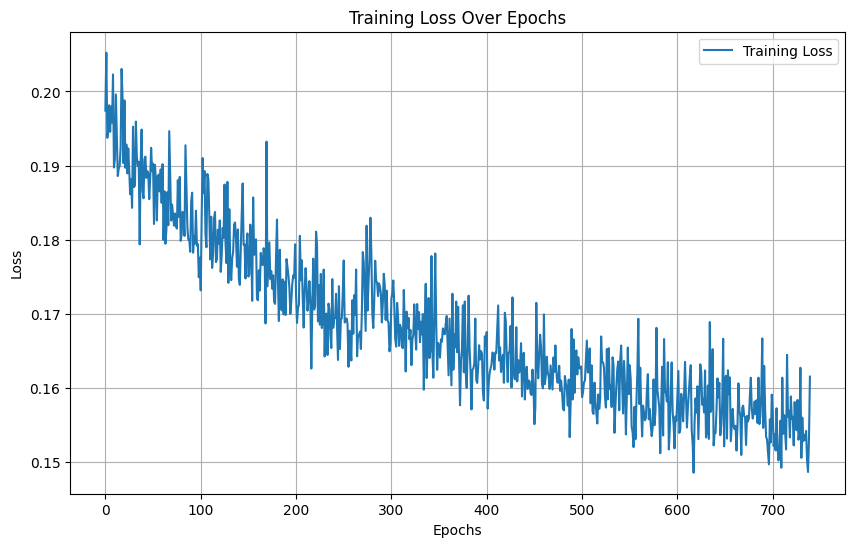

In [52]:
train_loss_np = [loss.cpu().detach().numpy() for loss in train_loss]

plt.figure(figsize=(10, 6))
plt.plot(train_loss_np, label='Training Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Training Loss Over Epochs')
plt.legend()
plt.grid(True)
plt.show()

##### Model evaluation

In [53]:
# model testing
model.eval()

losses = []

with torch.no_grad():
    for i, (masks, log_noisy_spec) in enumerate(test_loader):
        masks = masks.float()
        log_noisy_spec = log_noisy_spec.float()
        masks = masks.cuda()
        log_noisy_spec = log_noisy_spec.cuda()
        outputs = model(log_noisy_spec.unsqueeze(1))
        loss = criteria(outputs, masks.unsqueeze(1))
        losses.append(loss.item())
        if (i+1) % 10 == 0:
            print('Step [{}/{}], Loss: {:.4f}'.format(i+1, len(test_loader), loss.item()))

print("Average loss: {:.4f}".format(np.mean(losses)))

Step [10/32], Loss: 0.1670
Step [20/32], Loss: 0.1724
Step [30/32], Loss: 0.1696
Average loss: 0.1704


##### Save model

In [54]:
torch.save(model.state_dict(), "model.pt")

##### Test on sample

In [55]:
log_noisy_tensor = torch.from_numpy(log_noisy).float().cuda()

##### Predicted mask

In [56]:
predicted_mask = model(log_noisy_tensor.unsqueeze(0).unsqueeze(0))

predicted_mask = predicted_mask.cpu().detach().numpy()
predicted_mask = predicted_mask[0][0]

##### Binary mask

In [57]:
for i in range(len(predicted_mask)):
  for j in range(len(predicted_mask[i])):
    if(predicted_mask[i][j] < 0.5):
      predicted_mask[i][j] = 0
    else:
      predicted_mask[i][j] = 1

##### Apply mask

In [58]:
magnitude = torch.abs(torch.tensor(x_fft))
phase = torch.angle(torch.tensor(x_fft))

complex_spec = torch.complex(magnitude * torch.cos(phase), magnitude * torch.sin(phase))

x_masked = complex_spec * torch.tensor(predicted_mask)

##### Inverse fourier transform

In [59]:
x_masked = librosa.istft(x_masked.numpy(), n_fft=512, hop_length=256, win_length=512, window='hann', center=True, length=len(s))
x_masked = x_masked / np.max(np.abs(x_masked))

##### Write cleaned audio

In [60]:
write(os.path.join(denoising_folder, "denoised_" + str(8) + ".wav"), s_rate, x_masked.astype(np.float32))

##### Read cleaned audio

In [61]:
Audio(os.path.join(denoising_folder, "denoised_" + str(8) + ".wav"))

Text(0.5, 1.0, 'Original cleaned spectrogram')

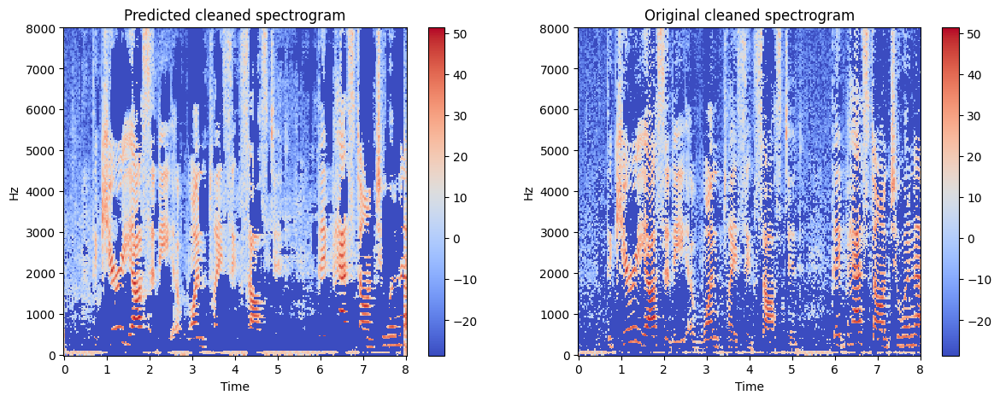

In [62]:
plt.figure(figsize=(22, 5))
plt.subplot(1, 3, 1)
librosa.display.specshow(librosa.amplitude_to_db(x_fft * predicted_mask), sr=s_rate, x_axis='time', y_axis='hz', cmap='coolwarm')
plt.colorbar()
plt.title("Predicted cleaned spectrogram")

# plot mask
plt.subplot(1, 3, 2)
librosa.display.specshow(librosa.amplitude_to_db(x_fft * mask), sr=s_rate, x_axis='time', y_axis='hz', cmap='coolwarm')
plt.colorbar()
plt.title("Original cleaned spectrogram")

In [63]:
cleaned, sr = librosa.load(denoising_folder + "denoised_8.wav", sr=16000)

In [64]:
original = s

In [65]:
noise = u

In [66]:
time_denoised = np.arange(0, len(cleaned)) / sr
time_clean = np.arange(0, len(original)) / sr

trace1 = go.Scatter(x=time_denoised, y=cleaned, mode='lines', name='Denoised Signal')
trace2 = go.Scatter(x=time_clean, y=original, mode='lines', name='Clean Signal')

data = [trace1, trace2]

# Layout
layout = go.Layout(
    title='Denoised vs Clean Signals',
    xaxis=dict(title='Time (seconds)'),
    yaxis=dict(title='Amplitude'),
    hovermode='closest'
)

# Figure
fig = go.Figure(data=data, layout=layout)

# Plot
fig.show()

In [67]:
def signalPower(x):
    return np.mean(np.abs(x)**2)

In [68]:
def SNR(signal1,signal2):
  return signalPower(signal1) / signalPower(signal2)

In [69]:
def SNR_db(snr):
    return 10 * np.log10(snr)

In [70]:
esp = np.mean(original * cleaned)

In [71]:
esp_hat = np.mean(cleaned ** 2)

In [72]:
beta = esp / esp_hat

In [73]:
time_denoised = np.arange(0, len(cleaned)) / sr
time_clean = np.arange(0, len(original)) / sr

trace1 = go.Scatter(x=time_denoised, y=beta * cleaned, mode='lines', name='Denoised Signal')
trace2 = go.Scatter(x=time_clean, y=original, mode='lines', name='Clean Signal')

data = [trace1, trace2]

# Layout
layout = go.Layout(
    title='Denoised vs Clean Signals',
    xaxis=dict(title='Time (seconds)'),
    yaxis=dict(title='Amplitude'),
    hovermode='closest'
)

# Figure
fig = go.Figure(data=data, layout=layout)

# Plot
fig.show()

In [74]:
e = beta * cleaned - original

In [75]:
SNR_in = SNR(original, noise)
SNR_in = SNR_in / alpha ** 2

SNRdb_in = SNR_db(SNR_in)

In [76]:
alpha

0.251188643150958

In [77]:
SNR_out = SNR(original,e)

SNRdb_out = SNR_db(SNR_out)

In [78]:
gain = SNRdb_out - SNRdb_in
gain

-1.4044977438432955